In [1]:
# imports
import math
import numpy as np
import time
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import matplotlib.pyplot as plt

# hyperparameters
batch_size  = 256
latent_size = 256
dataset = 'cifar10'

In [29]:
targetGPU = ""

if torch.cuda.is_available():
    targetDeviceNumber = None

    print("There are %d available GPUs:"%torch.cuda.device_count())
    for i in range(torch.cuda.device_count()):
        prefix = "    "
        if torch.cuda.get_device_name(i) == targetGPU:
            targetDeviceNumber = i
            prefix = "[🔥]"

        print("%s %s"%(prefix, torch.cuda.get_device_name(i)))

    if targetDeviceNumber != None:
        device = torch.device('cuda:%d'%targetDeviceNumber)
    else:
        device = torch.device('cuda')
        print("Cannot find target GPU, using cuda:0")
        #raise Exception("Cannot find target GPU")
else:
    device = torch.device('cpu')
    print("Cuda not avaliable, using CPU")
    #raise Exception("Not using GPU")

There are 1 available GPUs:
     GeForce GTX 1080 Ti
Cannot find target GPU, using cuda:0


In [3]:
image_size = None
image_channels = None
# helper function to make getting another batch of data easier
def cycle(iterable):
    while True:
        for x in iterable:
            yield x

# you may use cifar10 or stl10 datasets
if dataset == 'cifar10':
    train_loader = torch.utils.data.DataLoader(
        torchvision.datasets.CIFAR10('./Dataset/cifar10', train=True, download=True, transform=torchvision.transforms.Compose([
            torchvision.transforms.RandomHorizontalFlip(),
            #torchvision.transforms.ColorJitter(brightness=0.3, contrast=0.1, saturation=0.2, hue=0.1),
            torchvision.transforms.ToTensor(),
        ])),
        shuffle=True, batch_size=batch_size, drop_last=True
    )

    image_channels = 3
    image_size=32
    class_names = ['airplane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

# stl10 has larger images which are much slower to train on. You should develop your method with CIFAR-10 before experimenting with STL-10
if dataset == 'stl10':
    train_loader = torch.utils.data.DataLoader(
        torchvision.datasets.STL10('./Dataset/stl10', split='train+unlabeled', download=True, transform=torchvision.transforms.Compose([
            torchvision.transforms.ToTensor(),
        ])),
    shuffle=True, batch_size=batch_size, drop_last=True)
    
    image_channels = 3
    image_size=96
    class_names = ['airplane', 'bird', 'car', 'cat', 'deer', 'dog', 'horse', 'monkey', 'ship', 'truck'] # these are slightly different to CIFAR-10

train_iterator = iter(cycle(train_loader))

Files already downloaded and verified


# Utils


In [4]:
def CheckpointModel(model, checkpoint_name, epoch, loss):
    torch.save({'model':model.state_dict(), 'optimiser':model.optimiser.state_dict(), 'epoch':epoch, 'loss':loss}, 'Checkpoints/%s.chkpt'%checkpoint_name)

def RestoreModel(model, checkpoint_name):
    params = torch.load('Checkpoints/%s.chkpt'%checkpoint_name)
    model.load_state_dict(params['model'])
    model.optimiser.load_state_dict(params['optimiser'])
    epoch = params['epoch']
    loss = params['loss']
    return epoch, loss

In [5]:
from tqdm import trange

def TrainModel(model, total_epoch, start_epoch=0, iter_count=len(train_loader), p_epoch_loss=None, p_mmd=None, p_recon=None):

    epoch_iter = trange(start_epoch, total_epoch)
    
    epoch_loss = []
    if p_epoch_loss:
        epoch_loss = p_epoch_loss

    t_mmd = []
    if p_mmd:
        t_mmd = p_mmd

    t_recon = []
    if p_recon:
        t_recon = p_recon

    for epoch in epoch_iter:
        
        iter_loss = np.zeros(0)
        loss_item = None
        mmd_item = None
        recon_item = None
        

        for i in range(iter_count):
            # Get Data
            x,t = next(train_iterator)
            x,t = x.to(device), t.to(device)

            # Step Model
            loss, mmd_loss, recon_loss = model.forwardStep(x)
            model.backpropagate(loss)
            
            # Collect Stats
            loss_item = loss.detach().item()
            mmd_item = mmd_loss.detach().mean().cpu()
            recon_item = recon_loss.detach().mean().cpu()

            iter_loss = np.append(iter_loss, loss_item)

        
        
        epoch_loss.append(iter_loss.mean())
        t_mmd.append(mmd_item)
        t_recon.append(recon_item)

        # Print Status
        epoch_iter.set_description("Current Loss %.5f    Epoch" % loss_item)

    return (epoch_loss, t_mmd, t_recon)

In [6]:
import umap
import pandas as pd
import umap.plot
import matplotlib.pyplot as plt
import torchvision
import numpy as np

#######################################################
#                     Latent space                    #
#######################################################

def PlotLatentSpace(model,  train_iterator, device, class_names, point_count=1000):

    acc_labels = None
    acc_vals = None

    for i in range(point_count//256):
        # sample x from the dataset
        x,l = next(train_iterator)
        x,t = x.to(device), l.to(device)

        z = model.encode(x).cpu()

        latent_space = z.detach().numpy()
        labels = np.array(l)
        
        latent_space = np.squeeze(latent_space)

        if not acc_labels is None:
            acc_labels = np.concatenate((acc_labels, labels), axis=0)
            acc_vals = np.concatenate((acc_vals, latent_space))
        else:
            acc_labels = labels
            acc_vals = latent_space


    df = pd.DataFrame(data=acc_vals)

    mapper = umap.UMAP(n_neighbors=15).fit(df)
    df['labels'] = acc_labels
    df['labels'] = df['labels'].map(dict((i, val) for i, val in enumerate(class_names)))
    umap.plot.points(mapper, labels=df["labels"])

def PlotCustomLatentSpace(model, datasets, class_labels, latent_size, device):
    full_df =  pd.DataFrame()
    data_df = pd.DataFrame()
    labels_df = pd.DataFrame()

    data = np.empty([0, latent_size])
    labels = []
    indexes = []
    for i in range(len(datasets)):
        ds = datasets[i]
        l = class_labels[i]
        ds, l = ds.to(device), l

        z = model.encode(ds).detach().cpu().numpy()
        z = np.squeeze(z)
        data = np.concatenate((data, z), axis=0)
        labels+=[l]*len(ds)
        indexes += list(range(len(ds)))
    
    
    mapper = umap.UMAP(n_neighbors=15).fit(data)
    labels_df['labels']=labels
    labels_df['index']=indexes
    p = umap.plot.interactive(mapper, labels=labels_df['labels'], hover_data = labels_df, point_size=2)
    umap.plot.show(p)

#######################################################
#                       Other                         #
#######################################################
def PlotLoss(loss_array, loss_type="Loss"):
    plt.plot(loss_array)
    plt.ylabel(loss_type)
    plt.xlabel('Epoch')
    plt.show()

def PlotAllLoss(losses, loss_names):
    fig, axs = plt.subplots(len(losses), sharex=True, gridspec_kw={'hspace': 0})
    for i in range(len(losses)):
        axs[i].plot(losses[i])
        axs[i].set_ylabel(loss_names[i])
    plt.xlabel('Epoch')
    plt.show()

def plotTensor(tensor):
    plt.rcParams['figure.dpi'] = 175
    plt.grid(False)
    plt.axis('off')
    plt.imshow(torchvision.utils.make_grid(tensor).cpu().data.permute(0,2,1).contiguous().permute(2,1,0), cmap=plt.cm.binary)
    plt.show()

In [7]:
def PlotRandomLatentSample(model, count=8):
    rand_latent = model.getRandomSample()
    plotTensor(rand_latent[0:8])

def PlotReconstructionAttempt(model):
    x,t = next(train_iterator)
    #x = x[0:8]
    x = x.to(device)
    x_hat = model.encode(x)
    x_hat = model.decode(x_hat)
    x = x[0:8]
    x_hat = x_hat[0:8]
    plotTensor(x_hat)
    plotTensor(x)

def CompareByExample(model1, model2):
    x,t = next(train_iterator)
    #x = x[0:8]
    x = x.to(device)
    x_hat_a = model1.encode(x)
    x_hat_a = model1.decode(x_hat_a)
    x_hat_b = model2.encode(x)
    x_hat_b = model2.decode(x_hat_b)
    plotTensor(x[0:8])
    plotTensor(x_hat_a[0:8])
    plotTensor(x_hat_b[0:8])

# Model

In [25]:
################################
#              VAE             #
################################

import warnings

class VAE(nn.Module):
    def __init__(self, encoder, decoder, learning_rate = 1e-4):
        super().__init__()
        
        self.encoder = encoder
        self.decoder = decoder

        # output size depends on input size for some encoders
        demo_input = torch.ones([batch_size, image_channels, image_size, image_size])
        h_dim = self.encoder(demo_input).shape[1]
        
        if h_dim < latent_size:
            warnings.warn('latent dimension [%d] > encoded dimension [%d]', latent_size, h_dim)

        # Resize encoding to latent size 
        self.encode_to_z = nn.Linear(h_dim, latent_size)

        self.optimiser = torch.optim.Adam(self.parameters(), lr=learning_rate)
       


    def getRandomSample(self, count=batch_size):
        z = torch.rand(count, latent_size)
        z = z.to(device)
        return self.decode(z)

    def encode(self, x):
        x = self.encoder(x)
        x = self.encode_to_z(x)
        return x
  
    def decode(self, x):
        return self.decoder(x)

    def backpropagate(self, loss):
        self.optimiser.zero_grad()
        loss.backward()
        self.optimiser.step()

    # computeKernel and computeMMD are taken from https://github.com/napsternxg/pytorch-practice/blob/master/Pytorch%20-%20MMD%20VAE.ipynb, which is relaed under an Apache 2.0 license
    # which was a pytorch port of https://github.com/ShengjiaZhao/MMD-Variational-Autoencoder/blob/master/mmd_vae.ipynb
    def computeKernel(self, x, y):
        x_size = x.size(0)
        y_size = y.size(0)
        dim = x.size(1)
        x = x.unsqueeze(1) # (x_size, 1, dim)
        y = y.unsqueeze(0) # (1, y_size, dim)
        tiled_x = x.expand(x_size, y_size, dim)
        tiled_y = y.expand(x_size, y_size, dim)
        kernel_input = (tiled_x - tiled_y).pow(2).mean(2)/float(dim) # Gaussian kernel
        return torch.exp(-kernel_input) # (x_size, y_size)

    def computeMMD(self, x, y):
        x_kernel = self.computeKernel(x, x)
        y_kernel = self.computeKernel(y, y)
        xy_kernel = self.computeKernel(x, y)
        mmd = x_kernel.mean() + y_kernel.mean() - 2*xy_kernel.mean()
        return mmd


    def forwardStep(self, x):
        z = self.encode(x)
        x_hat = self.decode(z)

        # Take 200 random stamples from the prior distribution (which is normal in this case) 
        random_z_sample = torch.randn(200, latent_size, device=device)

        mmd = self.computeMMD(random_z_sample, z)

        # In our case the nll is proporition to the squared distance, so use that instead
        nll = (x_hat - x).pow(2).mean()
        loss = nll + mmd

        return loss, mmd, nll


In [26]:
################################
#            ResNet            #
################################
#
# this code is based on https://github.com/PyTorchLightning/pytorch-lightning-bolts/pl_bolts/models/autoencoders/components.py, which is released under the Apache 2.0 License
# which in turn used portions of code from https://github.com/pytorch/vision/blob/master/torchvision/models/resnet.py which is released under BSD 3-Clause License
#
# Resnet paper: https://arxiv.org/pdf/1512.03385.pdf
#

import torch
from torch import nn


# Simple 2 conv block
class EncoderBlock(nn.Module):
    def __init__(self, in_planes, working_planes, stride=1, downsample=None):
        super().__init__()
        self.conv1 = nn.Conv2d(in_planes, working_planes, kernel_size=3, stride=stride, padding=1, bias=True)
        self.bn1 = nn.BatchNorm2d(working_planes)
        
        self.conv2 = nn.Conv2d(working_planes, working_planes, kernel_size=3, stride=1, padding=1, bias=True)
        self.bn2 = nn.BatchNorm2d(working_planes)
        
        self.downsample = downsample

        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        identity = x

        if self.downsample is not None:
            identity = self.downsample(x)

        out = nn.Sequential(
            self.conv1,
            self.bn1,
            self.relu,
            self.conv2,
            self.bn2,
        )(x)

        out += identity # The magic skip connection
        out = self.relu(out)
        return out


# Simple 2 conv block
class DecoderBlock(nn.Module):
    # Encoder block in reverse
    #           Conv1       Conv2
    # Encode    Shrink         -
    # Decode      -         Grow

    def __init__(self, working_planes, out_planes, scale=1, upsample=None):
        super().__init__()
        self.conv1 = nn.Conv2d(working_planes, working_planes, kernel_size=3, stride=1, padding=1, bias=True)
        self.bn1 = nn.BatchNorm2d(working_planes)
        
        self.conv2 = nn.Sequential(
                nn.Upsample(scale_factor=scale), 
                nn.Conv2d(working_planes, out_planes, kernel_size=3, stride=1, padding=1, bias=True)
            )
        self.bn2 = nn.BatchNorm2d(out_planes)
        
        self.upsample = upsample
        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        identity = x

        if self.upsample is not None:
            identity = self.upsample(x)
        
        out = nn.Sequential(
            self.conv1,
            self.bn1,
            self.relu,
            self.conv2,
            self.bn2,
        )(x)

        out += identity # The magic skip connection
        out = self.relu(out)
        return out

#
# Fully connected layer
# Take "in_dim" input, gives "out_dim" outputs
# Uses "depth" fully connected layers
# Intermediate layers are logarithmically scaled
#
class FCLayer(nn.Module):
    def __init__(self, in_dim, out_dim, depth):
        super().__init__()

        self.relu = nn.ReLU(inplace=True)

        sf = out_dim/in_dim
        sf = sf**(1/float(depth))
        
        current_layers = in_dim
        layers=[]
        for i in range(depth-1):
            new_layers = int(current_layers*sf)
            layers.append(nn.Linear(current_layers, new_layers))
            layers.append(self.relu)
            current_layers = new_layers
        
        layers.append(nn.Linear(current_layers, out_dim))
        self.layers = nn.Sequential(*layers)

    def forward(self, x):
        return self.layers(x)

# Resnet encoder
# However use a fully connected layer at the end to take us from conv space to latent space
class FCResNetEncoder(nn.Module):

    def __init__(self, layers, latent_size, fc_depth):
        super().__init__()

        self.current_planes = 64 # As per paper - we start with 64 planes

        # Layer 1
        self.conv1 = nn.Conv2d(3, self.current_planes, kernel_size=7, stride=2, padding=3, bias=True)
        self.bn1 = nn.BatchNorm2d(self.current_planes)
        self.relu = nn.ReLU(inplace=True)

        # Layer 2
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
        self.conv_layer2 = self._make_layer(64, layers[0], stride=1)

        # Layer 3 -> 5
        self.conv_layer3 = self._make_layer(128, layers[1], stride=2)
        self.conv_layer4 = self._make_layer(256, layers[2], stride=2)
        self.conv_layer5 = self._make_layer(512, layers[3], stride=2)
        
        # Pool:  planes x H x W into: planes x 1 x 1
        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))

        # Fully connected layer to latent space
        self.fc_to_latent = FCLayer(512, latent_size, fc_depth)

    def _make_layer(self, layer_planes, blocks, stride=None):
        downsample = None

        # Each layer spatially downsamples the previous layer's output
        # We don't want to do this on the first layer as that is done in a special conv
        if stride != 1:
            downsample = nn.Sequential(
                nn.Conv2d(self.current_planes, layer_planes, kernel_size=1, stride=stride, bias=True),
                nn.BatchNorm2d(layer_planes),
            )


        layers = []

        # If we downsample then the first of n block downsamples
        layers.append(EncoderBlock(self.current_planes, layer_planes, stride, downsample))
        self.current_planes = layer_planes

        # The rest don't touch the dimensions
        for _ in range(1, blocks):
            layers.append(EncoderBlock(layer_planes, layer_planes))

        return nn.Sequential(*layers)

    def forward(self, x):
        x = nn.Sequential(
            self.conv1,
            self.bn1,
            self.relu,
            self.maxpool,
            self.conv_layer2,
            self.conv_layer3,
            self.conv_layer4,
            self.conv_layer5,
            self.avgpool,
        )(x)
        
        x = x.squeeze()
        x = self.fc_to_latent(x)
        return x


# Resnet decoder
# Does what the decoder does but backwards
# Uses a final 3x3 kernel instead of 7x7 to help recreate finer details
# Uses a fully connected layer at the begining to take us from latent space to conv space
class FCResNetDecoder(nn.Module):

    def __init__(self, layers, latent_dim, out_img_size, fc_depth):
        super().__init__()

        self.current_planes = 512 # As per paper

        self.starting_size = out_img_size // 32 # We scale up to 32x starting size
        self.fc_upscale = FCLayer(latent_dim, 512*self.starting_size*self.starting_size, fc_depth) # FC upscale to a size
        self.bn1 = nn.BatchNorm1d(512*self.starting_size*self.starting_size) 

        # Opposite Layer 5 -> 3
        self.conv_layer5 = self._make_layer(256, layers[0], scale=2) # 256 x 2x x 2x
        self.conv_layer4 = self._make_layer(128, layers[1], scale=2) # 128 x 4x x 4x
        self.conv_layer3 = self._make_layer(64, layers[2], scale=2) # 64 x 8x x 8x

        # Reverse second layer 3x3 stride 2
        self.conv_layer2 = self._make_layer(64, layers[3], scale=2) # 32 x 16x x 16x
        
        # Reverse 7x7 stride 2 downsampling, although use 3x3 kernel to help with finer details
        self.upscale = nn.Upsample(scale_factor=2)
        self.conv1 = nn.Conv2d(64, 3, kernel_size=3, stride=1, padding=1, bias=True) # 16 x 32x x 32x 

        self.renorm = nn.Sigmoid()

    def _make_layer(self, target_planes, blocks, scale=1):
        upsample = None
        if scale != 1:
            upsample = nn.Sequential(
                nn.Upsample(scale_factor=scale),
                nn.Conv2d(self.current_planes, target_planes , kernel_size=1, stride=1),
                nn.BatchNorm2d(target_planes),
            )

        layers = []
        layers.append(DecoderBlock(self.current_planes, target_planes, scale, upsample))
        self.current_planes = target_planes

        for _ in range(1, blocks):
            layers.append(DecoderBlock(self.current_planes, target_planes))

        return nn.Sequential(*layers)

    def forward(self, x):
        x = self.fc_upscale(x)
        x = self.bn1(x)
        x = x.view(x.size(0), 512, self.starting_size, self.starting_size)
    
        x = nn.Sequential(
            self.conv_layer5,
            self.conv_layer4,
            self.conv_layer3,
            self.conv_layer2,
            self.upscale,
            self.conv1,
            self.renorm,
        )(x)
        return x


# Uses the 2,2,2,2 config as proposed in paper
# There may be better distributions for layers
# but without an abundance of time I will assume He et al.
# found 2,2,2,2 to be particually good for the number of parameters    
def FCResNet18Encoder(latent_size):
    return FCResNetEncoder([2, 2, 2, 2], latent_size, 3)


def FCResNet18Decoder(latent_size, img_size):
    return FCResNetDecoder([2, 2, 2, 2], latent_size, img_size, 3)

# Train and Test

In [27]:
vae_enc = FCResNet18Encoder(latent_size)
vae_dec = FCResNet18Decoder(latent_size, image_size)
Vfcres = VAE(vae_enc, vae_dec).to(device)

#epoch, loss = RestoreModel(Vfcres, 'Vfcres-fix-10hr')
#all_loss = loss['loss']
#mmd_loss = loss['mmd']
#recon_loss = loss['recon']
#all_loss, mmd_loss, recon_loss = TrainModel(Vfcres, 10, p_epoch_loss=all_loss, p_mmd=mmd_loss, p_recon=recon_loss)

all_loss, mmd_loss, recon_loss = TrainModel(Vfcres, 1)
PlotAllLoss([all_loss, mmd_loss, recon_loss], ["Loss", "MMD", "Recon"])
PlotLoss(all_loss)

  0%|          | 0/1 [00:00<?, ?it/s]


ModuleAttributeError: 'VAE' object has no attribute 'encode_to_z'

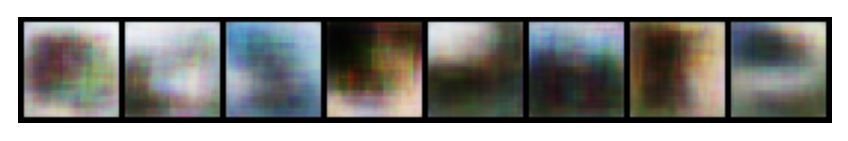

In [11]:
PlotRandomLatentSample(Vfcres)

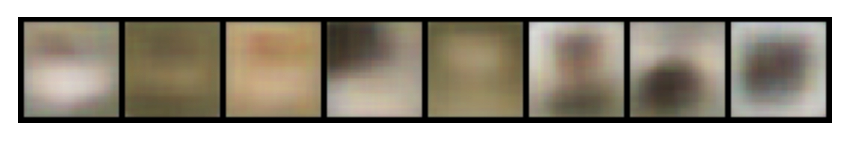

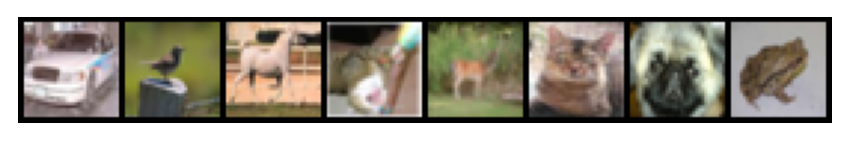

In [12]:
PlotReconstructionAttempt(Vfcres)

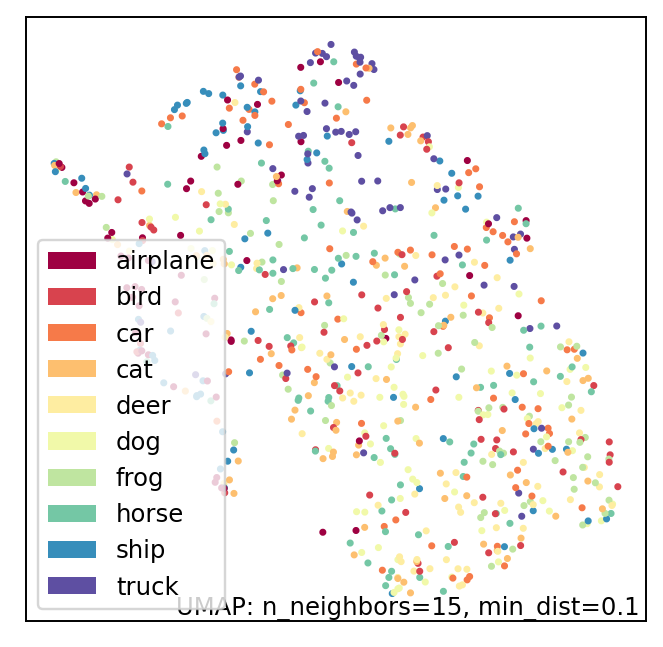

In [13]:
PlotLatentSpace(Vfcres, train_iterator, device, class_names)

In [14]:
def HorseBirdTensors(count=batch_size):
    hc = 0
    bc = 0

    horses = torch.zeros(count, image_channels, image_size, image_size, requires_grad=False)
    birds = torch.zeros(count, image_channels, image_size, image_size, requires_grad=False)

    while hc<count or bc<count:
        x,t = next(train_iterator)
        for i in range(len(t)):
            cn = class_names[t[i].item()]
            if cn == "horse" and hc<count:
                horses[hc] = x[i]
                hc+=1
            if cn == "bird" and bc<count:
                birds[bc] = x[i]
                bc+=1
    return horses, birds

def GetTensorOfClass(class_name, count=batch_size):
    if class_name not in class_names:
        raise Exception("%s is not in classes"%class_name)

    imgClass = torch.zeros(count, image_channels, image_size, image_size, requires_grad=False)
    ic = 0

    while ic<count:
        x,t = next(train_iterator)
        for i in range(len(t)):
            cn = class_names[t[i].item()]
            if cn == class_name and ic<count:
                imgClass[ic] = x[i]
                ic+=1
    return imgClass

def SeeHB(model):
    horses, birds = HorseBirdTensors(count=128)

    plotTensor(horses)
    plotTensor(birds)

def TryPegasusVBasic(model, width=8, rows=8):
    horses, birds = HorseBirdTensors(count=rows)

    gpu_horses = horses.to(device)
    gpu_birds = birds.to(device)
    z_horses = model.encode(gpu_horses)
    z_birds = model.encode(gpu_birds)
    
    
    z_amalgum = torch.zeros(rows*width, latent_size)
    for i in range(rows):
        cm = width-1
        for j in range(width):
            z_amalgum[i*width+j] = z_horses[i]*j/cm + z_birds[i]*(1-j/cm)

    z_amalgum = z_amalgum.to(device)
    pegasus_decoded = model.decode(z_amalgum)
    plotTensor(pegasus_decoded)

    plotTensor(horses)
    plotTensor(birds)


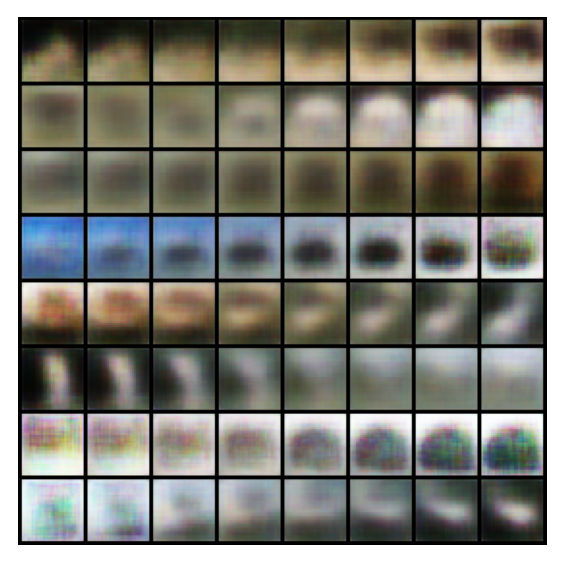

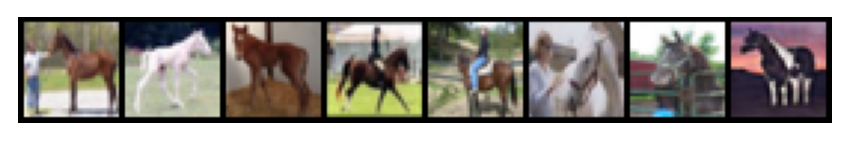

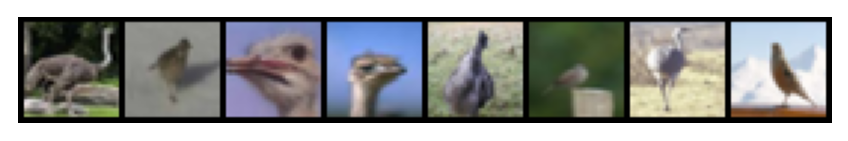

In [15]:
TryPegasusVBasic(Vfcres)

In [16]:
horses, birds = HorseBirdTensors(count=1000)
planes = GetTensorOfClass('airplane', 1000)
cats = GetTensorOfClass('cat', 1000)
deers = GetTensorOfClass('deer', 1000)
ships = GetTensorOfClass('ship', 1000)

In [17]:
from sklearn.cluster import KMeans

def createClusterModel(data_class_latent, clusters):
    all_data = np.concatenate(data_class_latent, axis=0)
    kmeans = KMeans(n_clusters=clusters, random_state=0).fit(all_data)
    return kmeans

def clusterClasses(model, data_classes, clusters):
    latent_classes = []
    for data in data_classes:
        data = data.to(device)
        data_encodeed = model.encode(data).detach().cpu().numpy()
        data_encodeed = np.squeeze(data_encodeed)
        latent_classes.append(data_encodeed)
    
    cluster_model = createClusterModel(latent_classes, clusters)
    
    all_classes = []
    for latent in latent_classes:
        predictions = cluster_model.predict(latent)
        classes = [[] for i in range(clusters)]

        for i in range(len(predictions)):
            classes[predictions[i]].append(i)
        
        all_classes.append(classes)
    return all_classes

def tensorFromCluster(data, clusters, cluster_i):
    this_cluster = clusters[cluster_i]
    images = torch.zeros(len(this_cluster), image_channels, image_size, image_size, requires_grad=False)
    for i in range(len(this_cluster)):
        img_i = this_cluster[i]
        images[i] = data[img_i]

    return images

def printImageFromCluster(data, clusters, cluster_i, max_plot=16):
    images = tensorFromCluster(data, clusters, cluster_i)
    plotTensor(images[0:min(len(images), max_plot)])

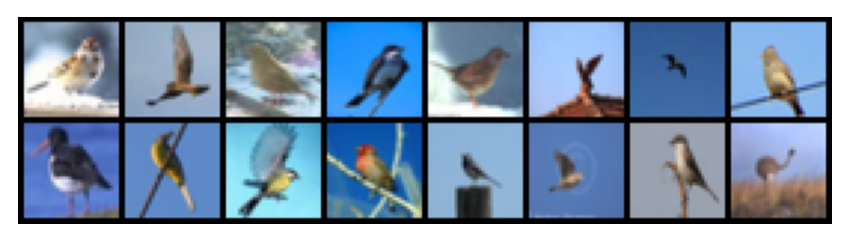

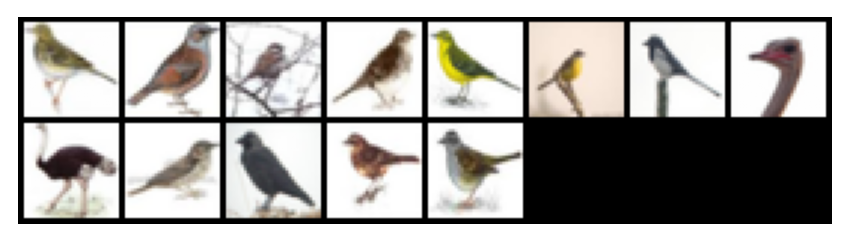

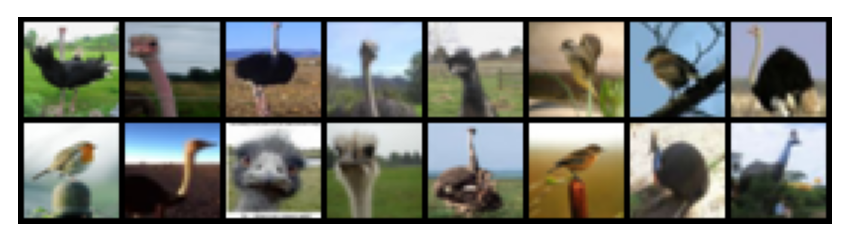

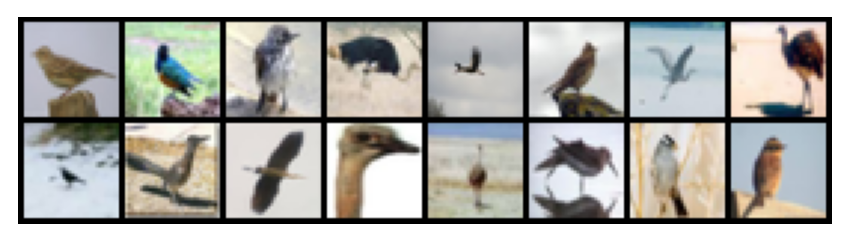

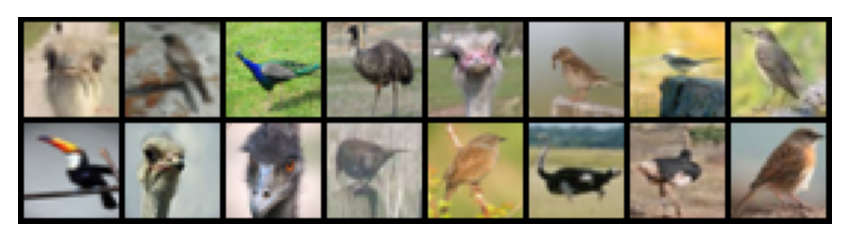

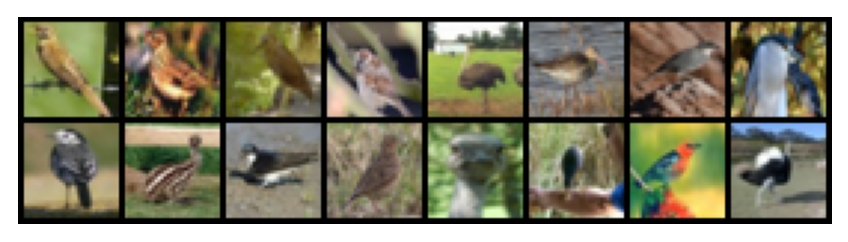

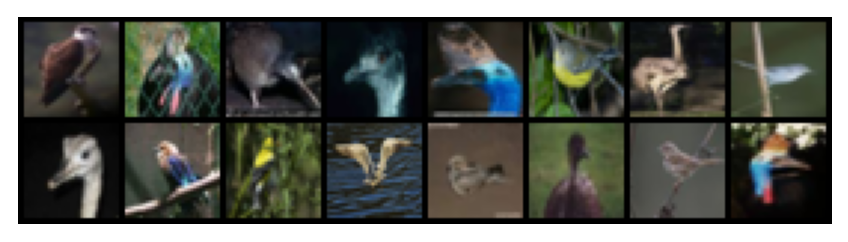

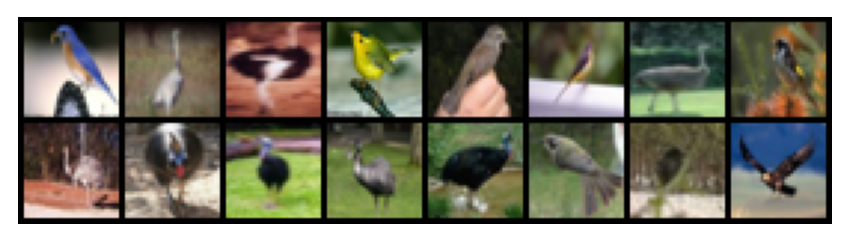

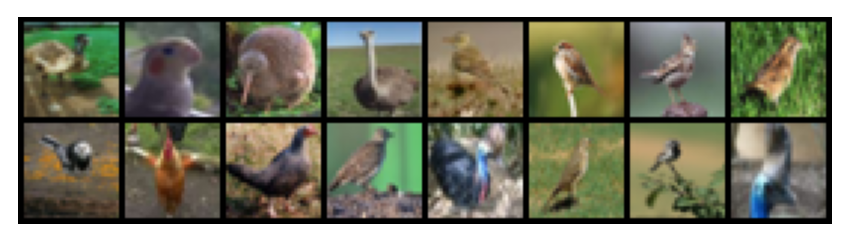

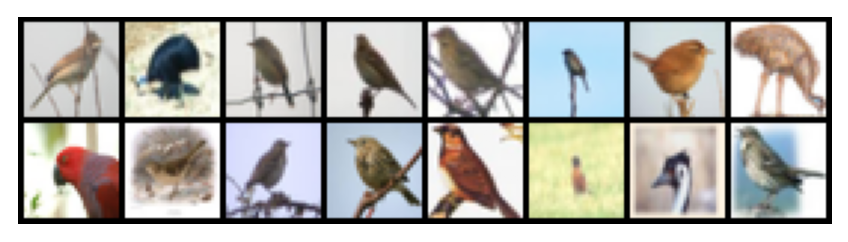

In [18]:
def whatDoClassesLookLike(ds):
    classes = clusterClasses(Vfcres, [ds], 10)
    classes = classes[0]
    for i in range(len(classes)):
        printImageFromCluster(ds, classes, i, max_plot=16)
whatDoClassesLookLike(birds)

In [19]:
test_ds = torchvision.datasets.CIFAR10('./Dataset/cifar10', train=True, download=True, transform=torchvision.transforms.Compose([
            torchvision.transforms.ToTensor(),
        ]))

Files already downloaded and verified


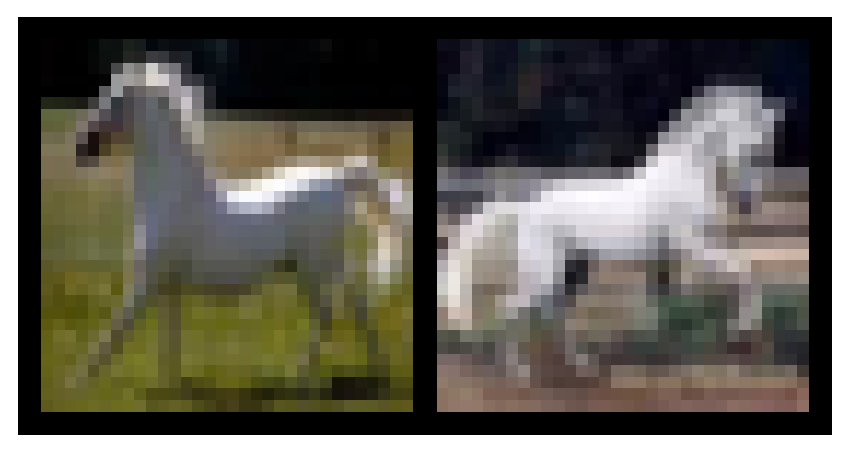

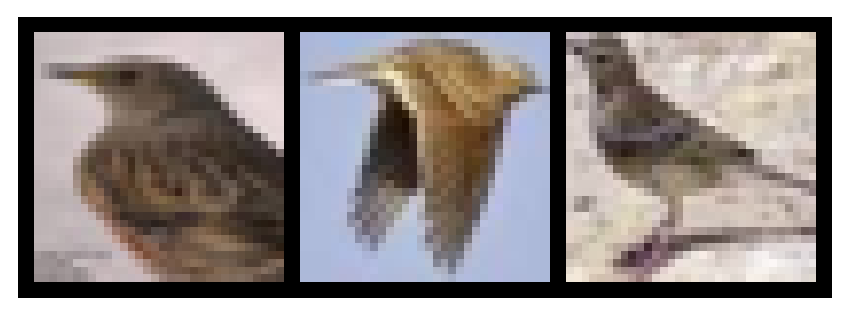

In [20]:
#good_birds = [2, 16, 17, 154, 184, 200, 233]
#good_birds = [2, 16, 17, 233]
good_birds = [2, 16, 17]


#good_horses = [228, 237, 292, 92]
#good_horses = [92, 292]
good_horses = [92, 292]


def getImageofClass(img_ids, class_name):
    if class_name not in class_names:
        raise Exception("Class doesnt exist")

    class_id = class_names.index(class_name)
    good_images = torch.zeros(len(img_ids), image_channels, image_size, image_size, requires_grad=False)
    gc = 0
    class_i = 0
    i=0
    while gc<len(img_ids):
        img, label = test_ds[i]
        if label == class_id:
            if class_i in img_ids: 
                good_images[gc] = img
                gc += 1
            class_i += 1
        i+=1


    return good_images

good_horse_imgs = getImageofClass(good_horses, 'horse')
if len(good_horses) == 1:
    good_horse_imgs = good_horse_imgs.repeat(2, 1, 1, 1)

good_bird_imgs = getImageofClass(good_birds, 'bird')
if len(good_birds) == 1:
    good_bird_imgs = good_bird_imgs.repeat(2, 1, 1, 1)
plotTensor(good_horse_imgs)
plotTensor(good_bird_imgs)

[[1], [], [], [], [], [], [], [], [], [0]]


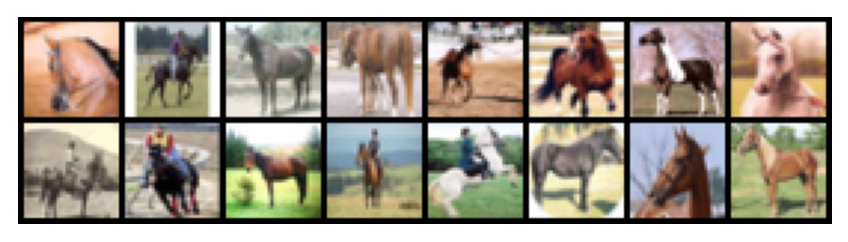

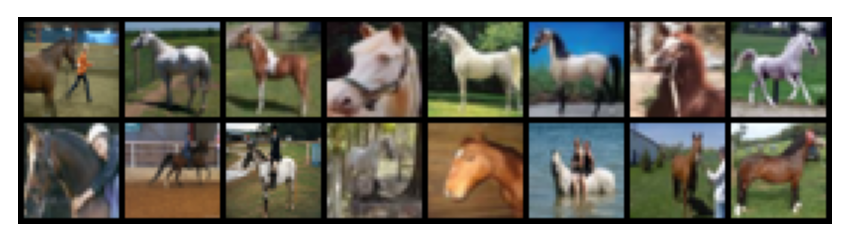

[[], [0], [], [], [1], [], [], [2], [], []]


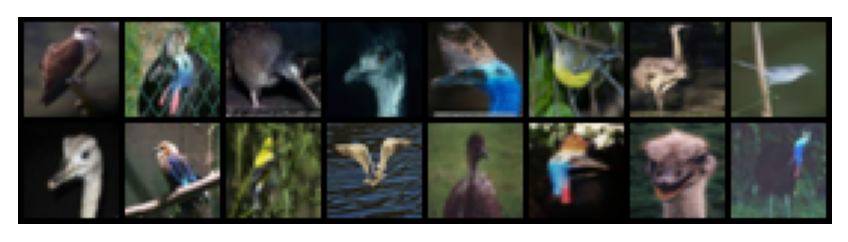

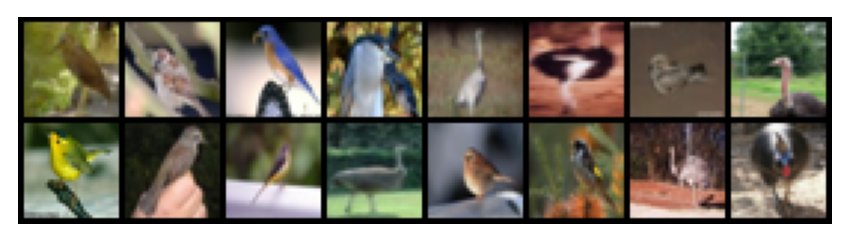

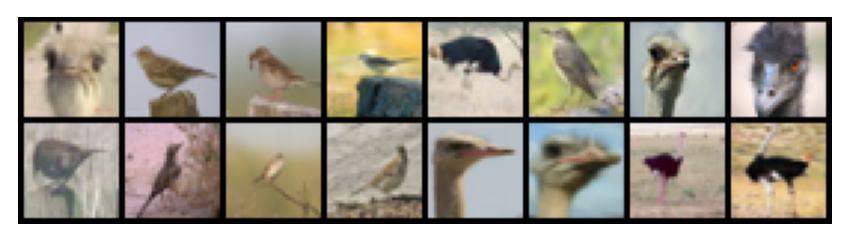

[[1], [], [], [], [], [], [], [], [], [0]]
[[], [0], [], [], [1], [], [], [2], [], []]
torch.Size([267, 3, 32, 32])
torch.Size([382, 3, 32, 32])


In [21]:
def PlotClassLike(like_this, from_this, clusters = 10):
    as_classes = clusterClasses(Vfcres, [from_this, like_this], clusters)
    print(as_classes[1])
    for i in range(clusters):
        if len(as_classes[1][i])>0:
            printImageFromCluster(from_this, as_classes[0], i)

def CreateSubsetLike(like_this, from_this, clusters = 10):
    as_classes = clusterClasses(Vfcres, [from_this, like_this], clusters)
    print(as_classes[1])
    tensors_from_classes = []
    for i in range(clusters):
        if len(as_classes[1][i])>0:                                     
            tensors_from_classes.append(tensorFromCluster(from_this, as_classes[0], i))
    return torch.cat(tensors_from_classes, dim=0)
    

PlotClassLike(good_horse_imgs, horses)
PlotClassLike(good_bird_imgs, birds)
goodish_horses = CreateSubsetLike(good_horse_imgs, horses)
goodish_birds = CreateSubsetLike(good_bird_imgs, birds)
print(goodish_horses.shape)
print(goodish_birds.shape)

In [22]:
import random
def TryPegasus(model, h, b, width=8, rows=8):
    ratio = 8

    gpu_horses = h.to(device)
    gpu_birds = b.to(device)
    z_horses = model.encode(gpu_horses)
    z_birds = model.encode(gpu_birds)

    h_rand_map = [random.randint(0, len(h)-1) for i in range(width*rows)]
    b_rand_map = [random.randint(0, len(b)-1) for i in range(width*rows)]
    
    
    z_amalgum = torch.zeros(rows*width, latent_size)
    for i in range(rows):
        for j in range(width):
            p = i*width+j
            z_amalgum[p] = z_horses[h_rand_map[p]]*(ratio/10) + z_birds[b_rand_map[p]]*(1-(ratio/10))

    z_amalgum = z_amalgum.to(device)
    pegasus_decoded = model.decode(z_amalgum)
    plotTensor(pegasus_decoded)

    return pegasus_decoded

def plotBestPegasus(imgs, column, row):
    i = column*8+row
    plotTensor(imgs[i:i+1])

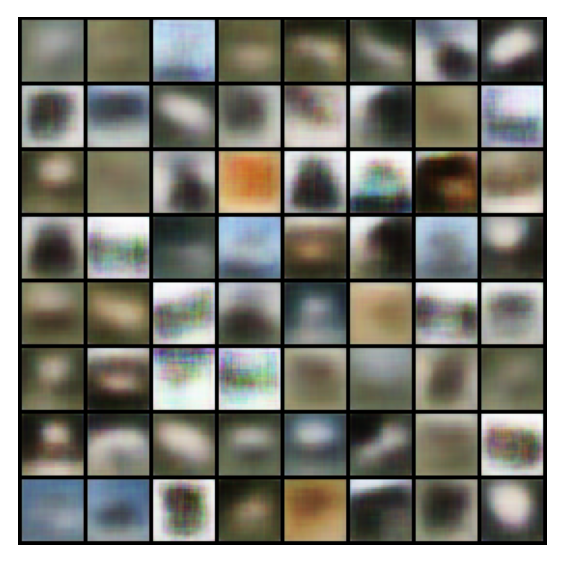

In [23]:
pegs = TryPegasus(Vfcres, goodish_horses, goodish_birds)

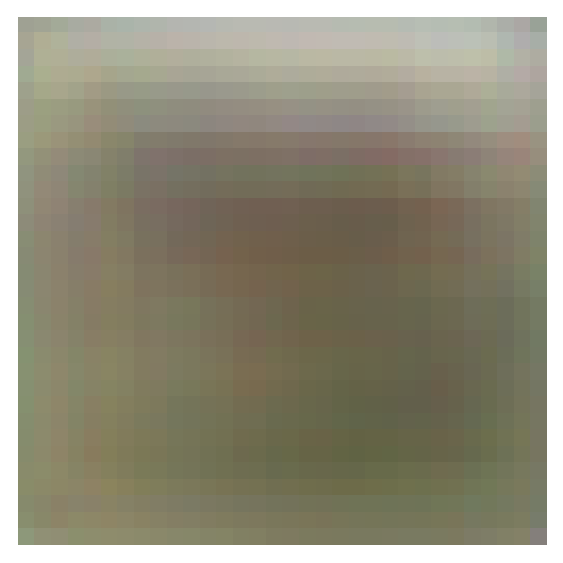

In [24]:
plotBestPegasus(pegs, 6,6)